In [7]:
from model import SpeechToText
import librosa as la 
from utils import print_plot_play

In [8]:

pretrained_model_paths = [
    "../hugging_face_models/whisper-base",
]

audio_file_paths = [
    "../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3",
]

/Users/alexandrospaliouras/.local/share/virtualenvs/speech_audio_semantic_search-wHLNCdIl/lib/python3.10/site-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (448) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


>> 0.0s - 30.0s:

MUSIC PLAYS There we go. Finally tonight, I want






































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


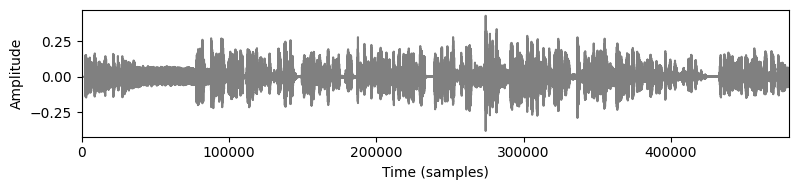

>> 15.0s - 30.0009375s:

Using pictures of traffic lights, but make no mistake,


































































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


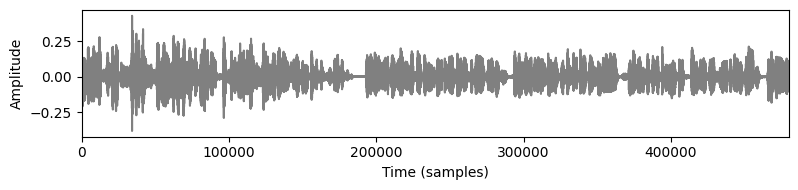

>> 30.0s - 30.001875s:

artificial intelligence to generate images. It's all because of




























































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


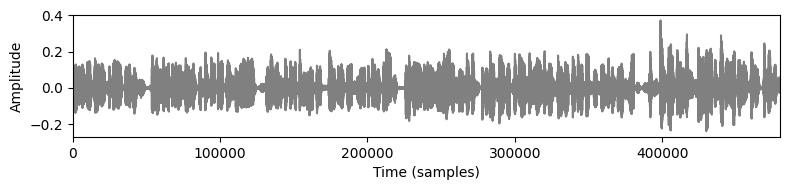

>> 45.0s - 30.0028125s:

You can be really elaborate with your descriptions. The




























































































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


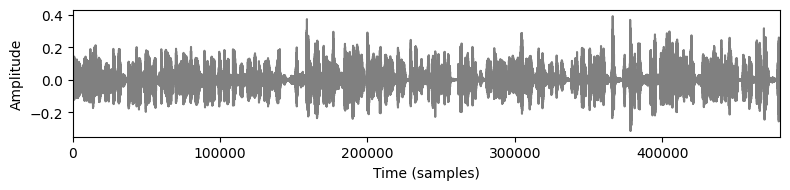

>> 60.0s - 30.00375s:

with each one you simply type in a text










































































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


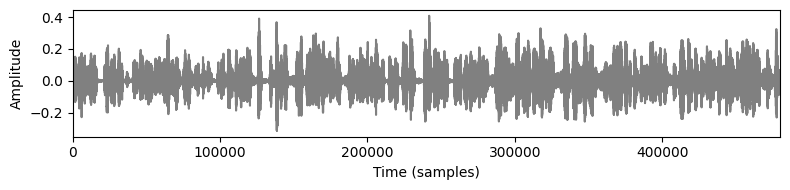

>> 75.0s - 30.0046875s:

I have no idea, but here's what Mee Journeys






















































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


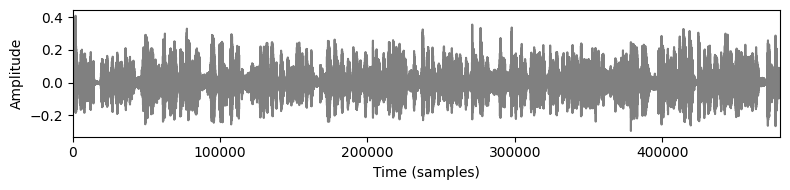

>> 90.0s - 30.005625s:

the homeless roast beef hero holding a roast beef


















































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


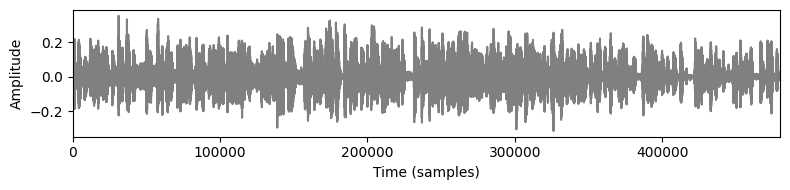

>> 105.0s - 30.0065625s:

five of the MCU right there. It is genuinely


























































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


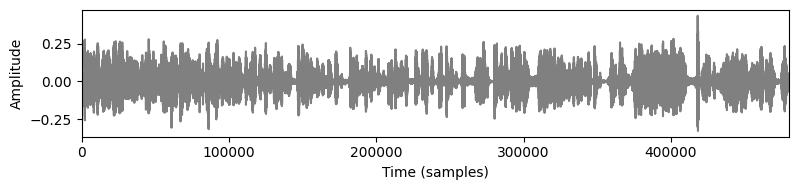

>> 120.0s - 30.0075s:

or Judy Dench fighting a centaur on the moon.




































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


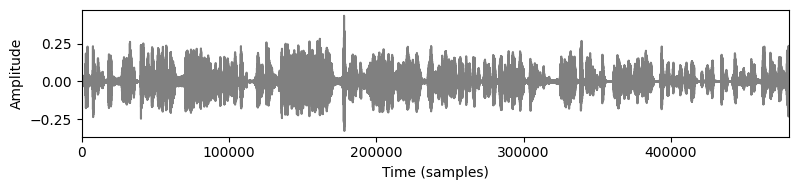

>> 135.0s - 30.0084375s:

to see what images others have requested, which is


















































































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


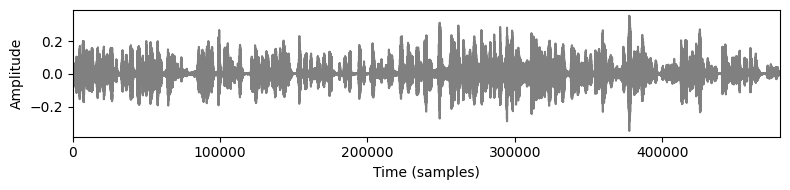

>> 150.0s - 30.009375s:

and Trial Count Footage of James Corden eating teeth.












































































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


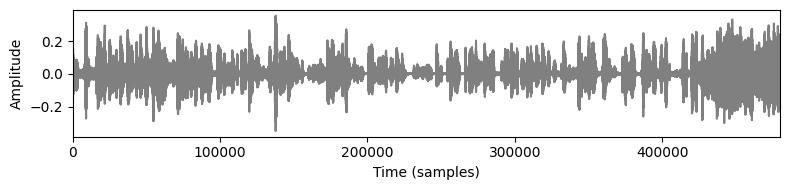

>> 165.0s - 30.0103125s:

eight for Colbert, a three a piece for Trevor














































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


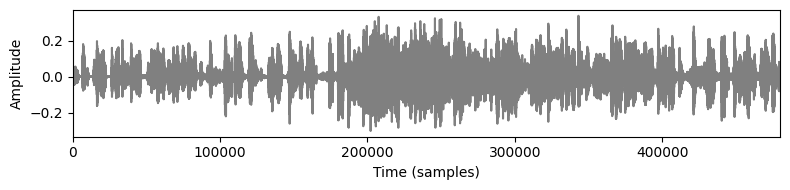

>> 180.0s - 30.01125s:

I get it. I get it. I do have
































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


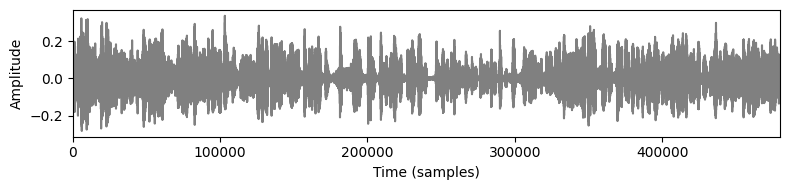

>> 195.0s - 30.0121875s:

And it's not just the volume, it's the specificity






























































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


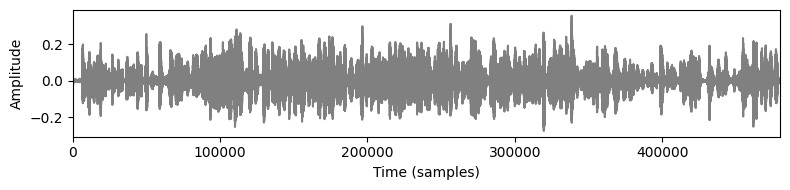

>> 210.0s - 30.013125s:

to charter potato. All of these deserve to be






























































































































































../audio_samples/AI_Images_Last_Week_Tonight_with_John_Oliver_(HBO).mp3 Fs = 16000, x.shape = (480000,), x.dtype = float32


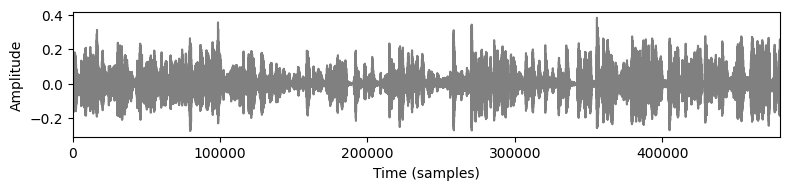

KeyboardInterrupt: 

In [18]:
for path in pretrained_model_paths:

    asr_model = SpeechToText(path)
    sr_resampled = 16000
    for audio_file in audio_file_paths:
        audio, sr = la.load(audio_file)
        audio_resampled = la.resample(audio, orig_sr=sr, target_sr=sr_resampled)
        
        # Calculate the frame size and frame overlap
        frame_size = int(sr_resampled * 30)  # 30 second frames
        hop_length = int(frame_size / 2)  # 50% overlap

        # Break the audio into frames
        audio_frames = la.util.frame(
            audio_resampled,
            frame_length=frame_size,
            hop_length=hop_length
        ).transpose()

        for i,frame in enumerate(audio_frames):

            frame_start = i*frame_size/2/sr_resampled
            frame_end = (frame_start + frame_size)/sr_resampled
            transcript = asr_model.generate_transcript(asr_model.featurize_audio(frame, sr_resampled))
            
            print(f">> {frame_start}s - {frame_end}s:")
            transcript_words = transcript[0].split()
            words_per_line = 
            for j in range(len(transcript_words)-11):
                print(f"\n{' '.join(transcript_words[j*11+1:j+11])}")
            print_plot_play(frame, sr_resampled, audio_file)